# Structural Similarity Index

The Structural Similarity Index (SSIM) is a metric to quantify the perceived similarity between two images. Unlike other metrics like Mean Squared Error (MSE) or Peak-Signal-to-Noise-Ratio (PSNR), which focus on the individual pixel differences independently, SSIM considers how humans perceive visual information in digital imaging. After applying a denoising technique, SSIM is calculated between the original noisy image and the denoised image. There are three factors  considered by SSIM:

- Luminance: measures the brightness similarity between the images. Is measured by averaging all of the pixel values.
- Contrast: measures the similarity in local variations of pixel intensities. Is measured by taking the standard deviation (square root of variance) of all pixel values.
- Structure: evaluates how well the spatial arrangement of pixels is preserved. Is measured by dividing the input signal with its standard deviation.
[source](https://medium.com/srm-mic/all-about-structural-similarity-index-ssim-theory-code-in-pytorch-6551b455541e)

The range of SSIM is from -1 to 1. Being closer to 1 indicates that the denoised image is perceptually similar to the original, meaning it has retained detail while removing noise.

## Benefits of Using SSIM

- Focuses on human perception: SSIM better reflects how we see images compared to metrics like PSNR.
- Guides denoising process: by monitoring SSIM, it is easy to fine-tune the denoising algorithm and find balance between noise removal and detail preservation.

For learning purposes, this notebook will be implementing code directly from [SKImage](https://scikit-image.org/docs/stable/auto_examples/transform/plot_ssim.html). I will be testing on a cat image that I have already downloaded from Pexels API in a previous notebook.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import img_as_float
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import mean_squared_error

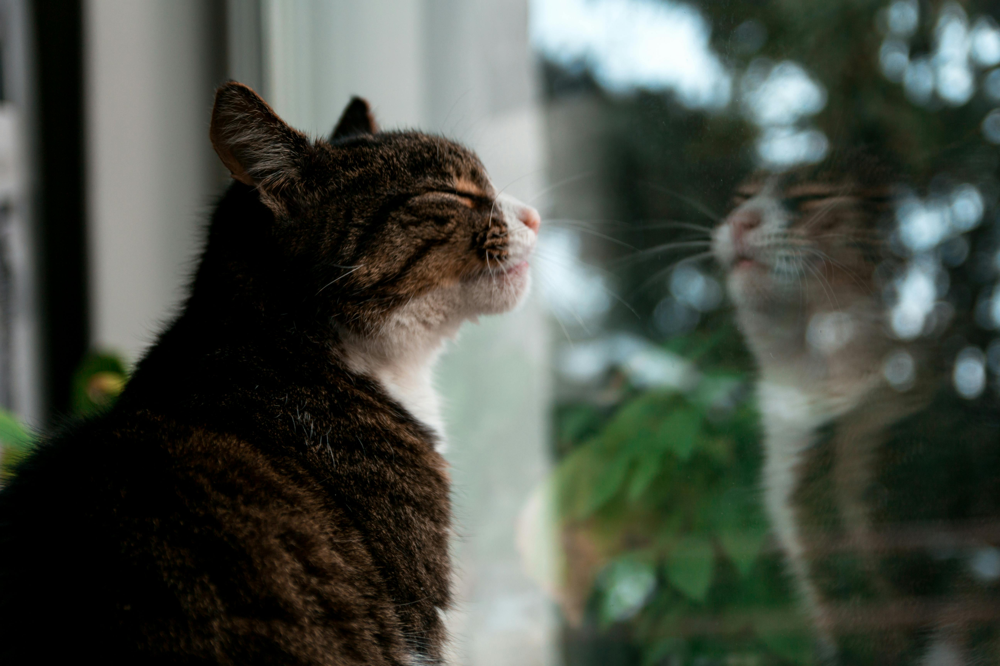

In [7]:
import os 
from PIL import Image
original_img = Image.open('./cat-test/887773.jpg')
original_img

In [10]:
# convert image to numpy array
original_img = np.asarray(original_img)
original_img.shape

(3456, 5184, 3)

In [11]:
img = img_as_float(original_img)

In [13]:
rows, cols, dim = img.shape

In [14]:
noise = np.ones_like(img) * 0.2 * (img.max() - img.min())
rng = np.random.default_rng()
noise[rng.random(size=noise.shape) > 0.5] *= -1

In [15]:
# creating images
img_noisy = img + noise
img_const = img + abs(noise)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


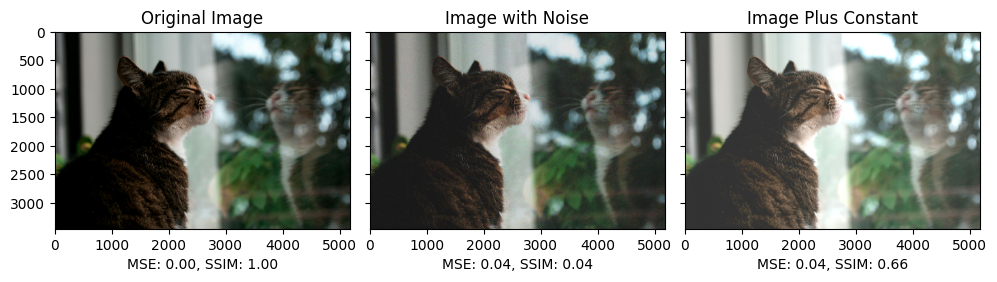

In [19]:
import matplotlib.style as style
# create plot
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(10,4),
                         sharex=True, sharey=True)
ax = axes.ravel()

mse_none = mean_squared_error(img, img)
ssim_none = ssim(img, img, data_range=img.max()-img.min(), channel_axis=2)

mse_noise = mean_squared_error(img, img_noisy)
ssim_noise = ssim(img, img_noisy, data_range=img_noisy.max()-img_noisy.min(), channel_axis=2)

mse_const = mean_squared_error(img, img_const)
ssim_const = ssim(img, img_const, data_range=img_const.max() - img_const.min(), channel_axis=2)

ax[0].imshow(img)
ax[0].set_xlabel(f'MSE: {mse_none:.2f}, SSIM: {ssim_none:.2f}')
ax[0].set_title('Original Image')

ax[1].imshow(img_noisy)
ax[1].set_xlabel(f'MSE: {mse_noise:.2f}, SSIM: {ssim_noise:.2f}')
ax[1].set_title('Image with Noise')

ax[2].imshow(img_const)
ax[2].set_xlabel(f'MSE: {mse_const:.2f}, SSIM: {ssim_const:.2f}')
ax[2].set_title('Image Plus Constant')

plt.tight_layout()
plt.show()

In the figure above we see that the MSE for the noisy and constant images are the same when compared to the original image; however, their similarities are drastically different in terms of how each is perceived to the human eye instead of the individual pixels that MSE evaluates.